In [1]:
import os
import shutil
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from models import basemodel, non_norm, ResnetLayer, Resnet, Resnet_regression, basemodel_regression, build_resnet, Resnet_pool
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split
import tensorflow as tf
from sklearn.metrics import confusion_matrix, accuracy_score
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
import pickle as pkl
import json
from scipy import signal
from scipy.ndimage import gaussian_filter1d
from MobiusAPI.http_post_get import mobius_post, mobius_get

gpus = tf.config.list_physical_devices('GPU')
if gpus:
  # 텐서플로가 첫 번째 GPU에 1GB 메모리만 할당하도록 제한
  try:
    tf.config.set_logical_device_configuration(
        gpus[3],
        [tf.config.LogicalDeviceConfiguration(memory_limit=10240)])
  except RuntimeError as e:
    # 프로그램 시작시에 가상 장치가 설정되어야만 합니다
    print(e)

2023-10-20 11:56:52.790937: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-10-20 11:56:52.952086: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-10-20 11:56:52.985916: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-10-20 11:56:53.743823: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; 

In [2]:
def subplot(data_dict):
    # 서브플롯 그리기
    num_profiles = 0
    maximum = 0
    for i in data_dict:
        num_profiles += len(data_dict[i])
        maximum = np.max((len(data_dict[i]), maximum))
    # num_profiles = len(data_dict)
    print(num_profiles)
    plt.figure(figsize=(maximum * 5, num_profiles))

    for col, (key,profile) in enumerate(data_dict.items(), 1):
        for idx, (key2, profile2) in enumerate(profile.items(), 1):
            plt_idx = col + len(data_dict) * (idx - 1)
            # if col == 1:
            #     plt_idx = 2 * idx - 1
            # else:
            #     plt_idx = 2 * idx
            r, c, p = int(maximum), len(data_dict), plt_idx
            plt.subplot(r, c, p)
            plt.imshow(profile2, aspect='auto', cmap='jet', interpolation='none')
            # plt.imshow(np.abs(profile), aspect='auto', cmap='jet', interpolation='none')
            plt.colorbar(label="dB")
            plt.xlabel("Range Bin")
            plt.ylabel("Pulse Number")
            plt.title(f"Range Profiles: {key}, {key2}")

    plt.tight_layout()
    plt.show()

In [3]:
def heatmap(matrix, title, label):
    save_path = 'plot/cm.png'
    df=pd.DataFrame(matrix, index = label, columns = label)
    plt.figure(figsize=(10,10))
    sns.heatmap(df, annot=True, fmt = 'd')
    plt.tick_params(axis='x', top=True, labeltop = True,bottom=False, labelbottom=False)
    plt.xticks(np.arange(0.5, len(df.columns), 1), df.columns)
    plt.yticks(np.arange(0.5, len(df.index), 1), df.index)
    plt.xlabel("Prediction",position = (0.5,1.0+0.05))
    plt.ylabel("Ground Truth")
    plt.title(title)
    plt.savefig(save_path, format='png', dpi=300)

In [4]:
def train_dnn(
    model, X, Y,
    test_X, test_Y, 
    # callback,
    Epoch = 50,
    cp_path = None,
    optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-3),
    loss = tf.keras.losses.CategoricalCrossentropy(),
    metrics = ['accuracy', 'categorical_crossentropy'],
    monitor = 'val_accuracy',
    mode = 'max'
    ):
    callback = tf.keras.callbacks.ModelCheckpoint(
        filepath = './model/' + cp_path,
        monitor= monitor,
        mode=mode,
        save_best_only = True,
        save_weigths_only = False,
    )
    # early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20)
    # optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate)
    # loss = tf.keras.losses.CategoricalCrossentropy()
    model.compile(optimizer = optimizer , loss = loss, 
                metrics = metrics)
    print('X shape : ', X.shape)
    # model.build(input_shape = (1, X.shape[1]))          
    model.build(input_shape = (None, X.shape[1]))
    model.summary()
    history = model.fit(X, Y,  epochs = Epoch,
                validation_data = (test_X, test_Y),
                # callbacks = [callback, early_stopping]
                callbacks = [callback]
                )
    model = tf.keras.models.load_model(('./model/'+cp_path))
    y_pred = np.argmax(model.predict(test_X), axis = 1)
    y_gt = np.argmax(test_Y, axis = 1)
    score = accuracy_score(y_gt, y_pred)
    print('Best score : {:.4f}'.format(score))

    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('model accuracy ' + cp_path)
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(['train', 'test'], loc='upper left')
    plt.savefig('./model_plot/accuracy_' + cp_path + '.png')

    # Y_pred_label = np.array([idx2label_Dict[y_pred[i]] for i in range(len(y_pred))])
    # Y_gt_label = np.array([idx2label_Dict[y_gt[i]] for i in range(len(y_gt))])
    # cm = confusion_matrix(Y_gt_label, Y_pred_label)
    # label = ['Asphalt', 'Brick', 'Tile', 'Sandbed', 'Urethane']
    # heatmap(cm, 'Road_surface_classification', label)
    return history

def train_dnn_reg(
    model, X, Y,
    test_X, test_Y, 
    # callback,
    Epoch = 50,
    cp_path = None,
    optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-3),
    loss = tf.keras.losses.MeanSquaredError(),
    metrics = ['mae', 'mse'],
    monitor = 'val_loss',
    mode = 'min'
    ):
    callback = tf.keras.callbacks.ModelCheckpoint(
        filepath = './model/' + cp_path,
        monitor= monitor,
        mode=mode,
        save_best_only = True,
        save_weigths_only = False,
    )
    # early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20)
    # optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate)
    # loss = tf.keras.losses.CategoricalCrossentropy()
    model.compile(optimizer = optimizer , loss = loss, 
                metrics = metrics)
    print('X shape : ', X.shape)
    # model.build(input_shape = (1, X.shape[1]))          
    model.build(input_shape = (None, X.shape[1]))
    model.summary()
    history = model.fit(X, Y,  epochs = Epoch,
                validation_data = (test_X, test_Y),
                # callbacks = [callback, early_stopping]
                callbacks = [callback]
                )
    model = tf.keras.models.load_model(('./model/'+cp_path))
    y_pred = np.around(model.predict(test_X))
    y_gt = test_Y
    score = accuracy_score(y_gt, y_pred)
    print('Best score : {:.4f}'.format(score))

    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model accuracy ' + cp_path)
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(['train', 'test'], loc='upper left')
    plt.savefig('./model_plot/accuracy_' + cp_path + '.png')

    # Y_pred_label = np.array([idx2label_Dict[y_pred[i]] for i in range(len(y_pred))])
    # Y_gt_label = np.array([idx2label_Dict[y_gt[i]] for i in range(len(y_gt))])
    # cm = confusion_matrix(Y_gt_label, Y_pred_label)
    # label = ['Asphalt', 'Brick', 'Tile', 'Sandbed', 'Urethane']
    # heatmap(cm, 'Road_surface_classification', label)
    return history

def train(
    model, X, Y,
    test_X, test_Y, 
    # callback,
    Epoch = 50,
    cp_path = None,
    optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-3),
    loss = tf.keras.losses.CategoricalCrossentropy(),
    metrics = ['accuracy', 'categorical_crossentropy'],
    monitor = 'val_accuracy',
    mode = 'max'
    ):
    callback = tf.keras.callbacks.ModelCheckpoint(
        filepath = './model/' + cp_path,
        monitor= monitor,
        mode=mode,
        save_best_only = True,
        save_weigths_only = False,
    )
    # early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20)
    # optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate)
    # loss = tf.keras.losses.CategoricalCrossentropy()
    model.compile(optimizer = optimizer , loss = loss, 
                metrics = metrics)
    print('X shape : ', X.shape)
    # model.build(input_shape = (1, X.shape[1]))          
    model.build(input_shape = (None, X.shape[1], 1))
    model.summary()
    history = model.fit(X, Y,  epochs = Epoch,
                validation_data = (test_X, test_Y),
                callbacks = [
                    callback, 
                    # early_stopping
                    ]
                )
    model = tf.keras.models.load_model(('./model/'+cp_path))
    y_pred = np.argmax(model.predict(test_X), axis = 1)
    y_gt = np.argmax(test_Y, axis = 1)
    score = accuracy_score(y_gt, y_pred)
    print('Best score : {:.4f}'.format(score))

    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('model accuracy ' + cp_path)
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(['train', 'test'], loc='upper left')
    plt.savefig('./model_plot/accuracy_' + cp_path + '.png')

    Y_pred_label = y_pred
    Y_gt_label = y_gt
    cm = confusion_matrix(Y_gt_label, Y_pred_label)
    label = [str(i) for i in range(test_Y.shape[1])]
    heatmap(cm, 'Counting', label)
    return history

def train_regression(
    model, X, Y,
    test_X, test_Y, 
    # callback,
    Epoch = 50,
    cp_path = None,
    optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-3),
    loss = tf.keras.losses.MeanSquaredError(),
    metrics = ['mae', 'mse'],
    monitor = 'val_loss',
    mode = 'min'
    ):
    callback = tf.keras.callbacks.ModelCheckpoint(
        filepath = './model/' + cp_path,
        monitor= monitor,
        mode=mode,
        save_best_only = True,
        save_weigths_only = False,
    )
    early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20)
    # optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate)
    # loss = tf.keras.losses.CategoricalCrossentropy()
    model.compile(optimizer = optimizer , loss = loss, 
                metrics = metrics)
    print('X shape : ', X.shape)
    # model.build(input_shape = (1, X.shape[1]))          
    model.build(input_shape = (None, X.shape[1], 1))
    model.summary()
    history = model.fit(X, Y,  epochs = Epoch,
                validation_data = (test_X, test_Y),
                callbacks = [callback, early_stopping]
                )
    model = tf.keras.models.load_model(('./model/'+cp_path))
    y_pred = np.around(model.predict(test_X))
    y_gt = test_Y
    score = accuracy_score(y_gt, y_pred)
    print('Best score : {:.4f}'.format(score))

    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model accuracy ' + cp_path)
    plt.xlabel('Epoch')
    plt.ylabel('MSE')
    plt.legend(['train', 'test'], loc='upper left')
    plt.savefig('./model_plot/accuracy_' + cp_path + '.png')


    # Y_pred_label = np.array([idx2label_Dict[y_pred[i]] for i in range(len(y_pred))])
    # Y_gt_label = np.array([idx2label_Dict[y_gt[i]] for i in range(len(y_gt))])
    # cm = confusion_matrix(Y_gt_label, Y_pred_label)
    # label = ['Asphalt', 'Brick', 'Tile', 'Sandbed', 'Urethane']
    # heatmap(cm, 'Road_surface_classification', label)
    return history

# def heatmap(matrix, title, label):
#     save_path = 'plot/cm.png'
#     df=pd.DataFrame(matrix, index = label, columns = label)
#     plt.figure(figsize=(10,10))
#     sns.heatmap(df, annot=True, fmt = 'd')
#     plt.tick_params(axis='x', top=True, labeltop = True,bottom=False, labelbottom=False)
#     plt.xticks(np.arange(0.5, len(df.columns), 1), df.columns)
#     plt.yticks(np.arange(0.5, len(df.index), 1), df.index)
#     plt.xlabel("Prediction",position = (0.5,1.0+0.05))
#     plt.ylabel("Ground Truth")
#     plt.title(title)
#     plt.savefig('cm.png', format='png', dpi=300)

In [5]:
def createFolder(directory):
    try:
        if not os.path.exists(directory):
            os.makedirs(directory)
    except OSError:
        print ('Error: Creating directory. ' +  directory)

In [6]:
def file_sort(path):
    file_list = os.listdir(path)
    for file in file_list:
        if os.path.isfile(os.path.join(path, file)):
            tmp = file.split('_')
            tmp[0] = tmp[0].zfill(2)
            createFolder('./'+path+'/' + tmp[0])
            shutil.move('./'+path+'/' + file, './'+path+'/' + tmp[0] + '/' + file)

In [7]:
def file_load(path):
    # data = list()
    file_list = os.listdir(path)
    data = None
    for file in file_list:
        file_path = os.path.join(path,file)
        if os.path.isfile(file_path):
            # print(file_path)
            try:
                temp = np.load(file_path)

                if data is not None:
                    data = np.concatenate((data, temp), axis = 0)
                else:
                    data = temp
            except:
                print('error', file_path)
            # data.append(temp)
    return np.squeeze(data, axis = 1)

def file_load2(path):
    # data = list()
    file_list = os.listdir(path)
    data = None
    data_dict = dict()
    for file in file_list:
        file_path = os.path.join(path,file)
        temp_key = file.split('_')[1]
        if os.path.isfile(file_path):
            # print(file_path)
            try:
                temp_data = np.squeeze(np.load(file_path), axis=1)
                temp_data = np.expand_dims(temp_data, axis = 2)
                if temp_key not in data_dict.keys():
                    data_dict[temp_key] = temp_data
                else:
                    data_dict[temp_key] = np.concatenate((data_dict[temp_key], temp_data), axis = 0)
            except:
                print('error', file_path)
            # data.append(temp)
    sorted_data = dict(sorted(data_dict.items(), key=lambda x: x[0]))
    return sorted_data

In [8]:
def file_load_split(folder_path, folder_list, minmax, initial_data = None):
    train_dict = dict()
    test_dict = dict()
    for folder in folder_list:
        temp_path = os.path.join(folder_path,folder)
        file_list = os.listdir(temp_path)
        for file in file_list:
            temp_file = file.split('_')
            file_path = os.path.join(temp_path, file)
            if os.path.isfile(file_path):
                # print(file_path)
                temp = np.squeeze(np.load(file_path), axis = 1)
                temp = np.expand_dims(temp, axis = 2)
                # temp = minmax.transform(np.squeeze(np.load(file_path), axis = 1))
                if initial_data is not None:
                    temp = np.subtract(temp, initial_data)
                temp = minmax.transform(temp)
                if temp_file[1] == '5' or temp_file[1] == '4':
                    test_dict = make_arr(test_dict, folder, temp)
                else:
                    train_dict = make_arr(train_dict, folder, temp)
    return train_dict, test_dict

def make_arr(dict, key, data):
    if key in dict.keys():
        dict[key] = np.concatenate((dict[key], data), axis = 0)
    else:
        dict[key] = data
    return dict

In [9]:
# folder_path = 'counting_cylinder_demo'
folder_path = 'counting_disk'
# folder_path = 'counting'
# folder_path = 'countingdatasmall'

In [10]:
file_sort(folder_path)

In [11]:
folder_list = os.listdir(folder_path)

In [12]:
folder_list = sorted(folder_list)

In [13]:
data_dict = dict()
for folder in folder_list:
    temp_path = os.path.join(folder_path,folder)
    data_dict[folder] = file_load2(temp_path)

In [14]:
data_dict['00']['0'].shape

(100, 301, 1)

In [16]:
sample_data = np.expand_dims(data_dict['00']['0'][0], axis=0)
data = {
    'input_1': sample_data.tolist()
}

In [18]:
with open('sample_data.json', 'w') as outfile:
    json.dump(data, outfile)

In [16]:
sub_data = dict()
subminmax = MinMaxScaler()
for folder in folder_list:
    sub_data[folder] = dict()
    # if folder != 'initial':
    for num in data_dict[folder].keys():
        initial_data = np.mean(data_dict['initial'][num], axis = 0)
        temp = np.subtract(data_dict[folder][num], initial_data)
        if num in sub_data.keys():
            sub_data[folder][num] = np.concatenate((sub_data[num], temp), axis = 0)
        else:
            sub_data[folder][num] = temp
        # sub_data[folder][num] = np.reshape(sub_data[folder][num], (sub_data[folder][num].shape[0], sub_data[folder][num].shape[2], 1))

KeyError: '6'

In [24]:
sub_data = dict()
subminmax = MinMaxScaler()
for folder in folder_list:
    sub_data[folder] = dict()
    # if folder != 'initial':
    for num in data_dict[folder].keys():
        initial_data = np.mean(data_dict['initial'][num], axis = 0)
        temp = np.subtract(data_dict[folder][num], initial_data)
        normalized_temp = np.zeros_like(temp)
        for i in range(normalized_temp.shape[0]):
            # print(temp[i].shape)
            normalized_temp[i] = gaussian_filter1d(subminmax.fit_transform(temp[i]), sigma=0.5)
        if num in sub_data.keys():
            sub_data[folder][num] = np.concatenate((normalized_temp[num], temp), axis = 0)
        else:
            sub_data[folder][num] = normalized_temp
        # sub_data[folder][num] = np.reshape(sub_data[folder][num], (sub_data[folder][num].shape[0], sub_data[folder][num].shape[2], 1))

In [15]:
normalized_data = dict()
for folder in folder_list:
    normalized_data[folder] = dict()
    # if folder != 'initial':
    for num in data_dict[folder].keys():
        # initial_data = np.mean(data_dict['initial'][num], axis = 0)
        # temp = np.subtract(data_dict[folder][num], initial_data)
        temp = data_dict[folder][num]
        minmax = MinMaxScaler()
        normalized_temp = np.zeros_like(temp)
        for i in range(normalized_temp.shape[0]):
            # print(temp[i].shape)
            normalized_temp[i] = gaussian_filter1d(minmax.fit_transform(temp[i]), sigma=0.5)
        # temp = minmax.fit_transform(temp)
        if num in normalized_data.keys():
            normalized_data[folder][num] = np.concatenate((normalized_data[num], normalized_temp), axis = 0)
        else:
            normalized_data[folder][num] = normalized_temp
        # sub_data[folder][num] = np.reshape(sub_data[folder][num], (sub_data[folder][num].shape[0], sub_data[folder][num].shape[2], 1))

52


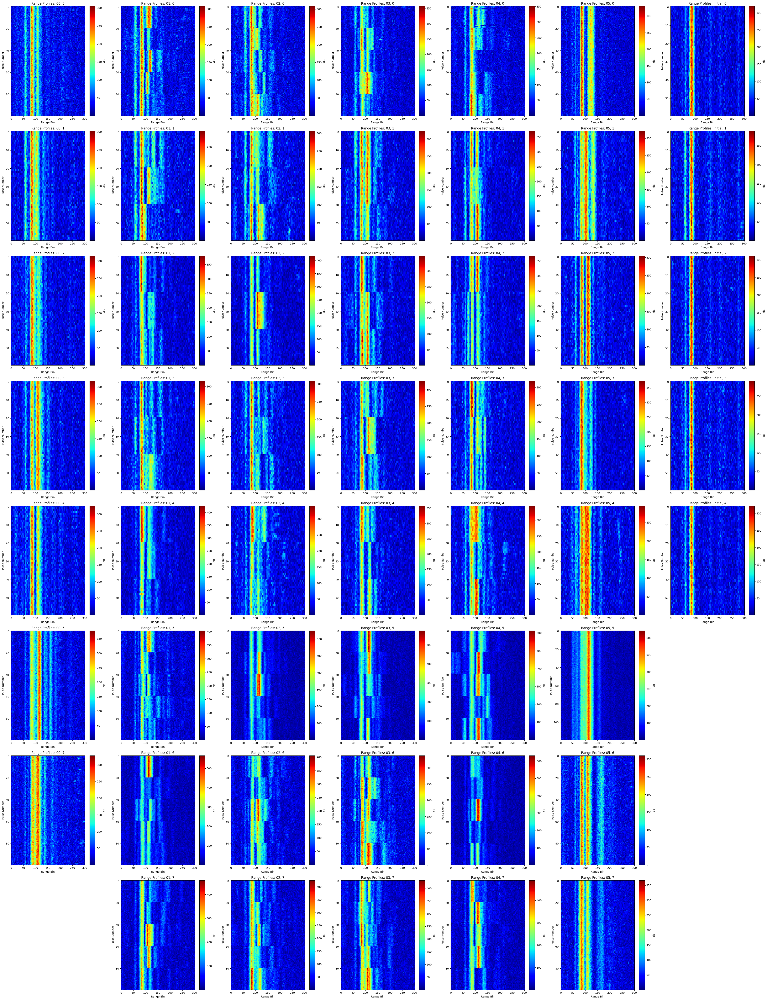

In [17]:
subplot(data_dict)

35


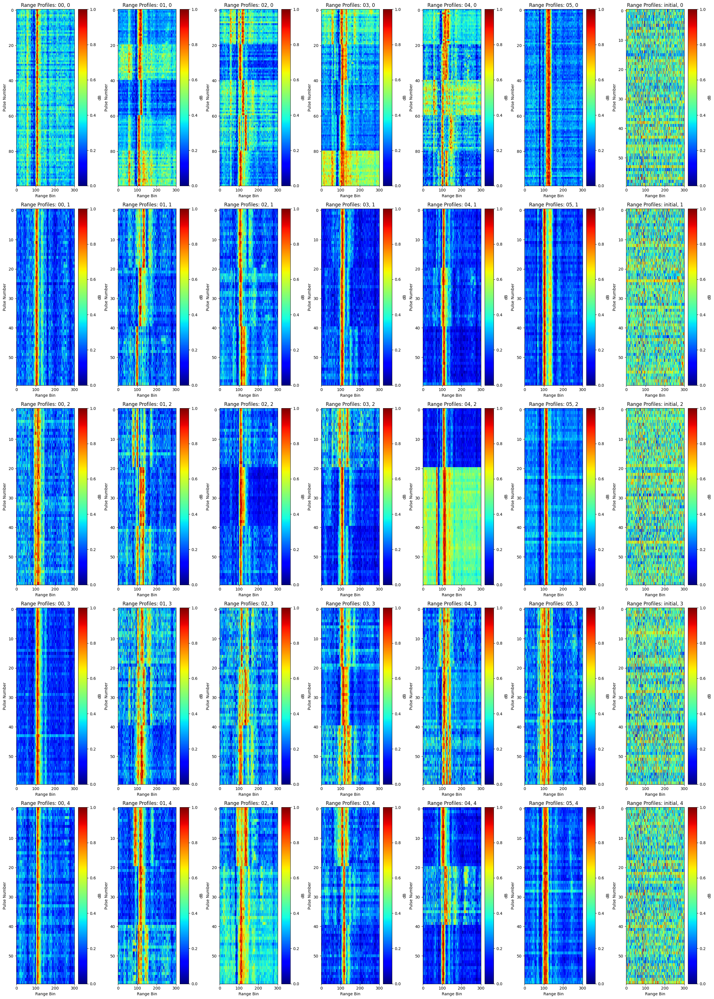

In [25]:
subplot(sub_data)

52


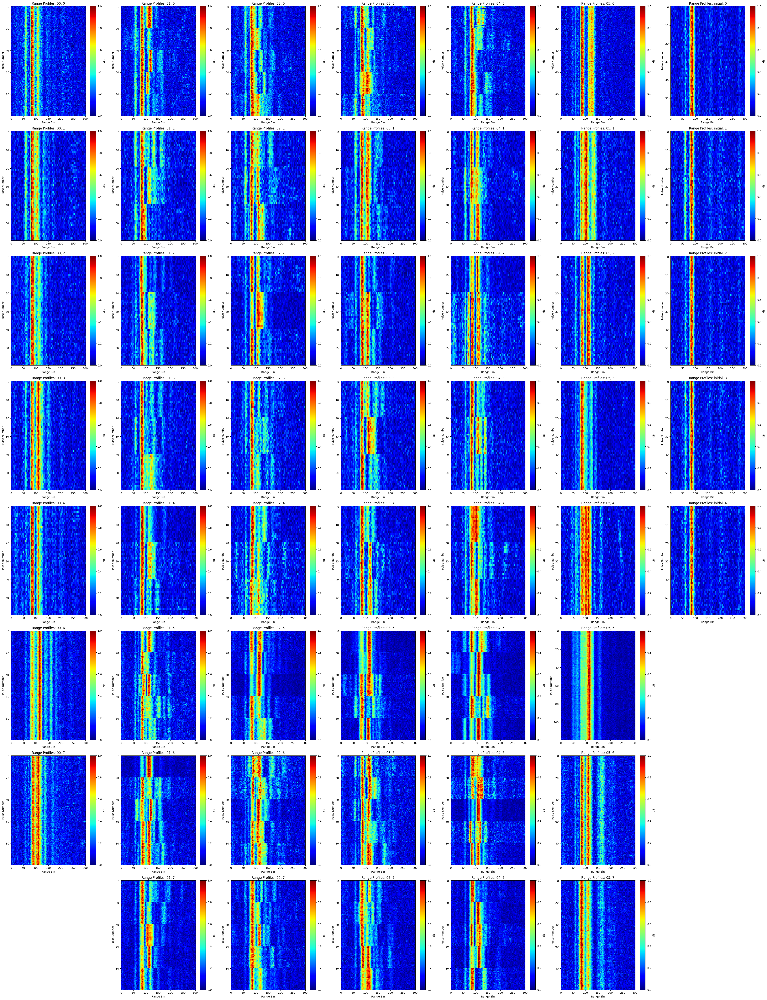

In [17]:
subplot(normalized_data)

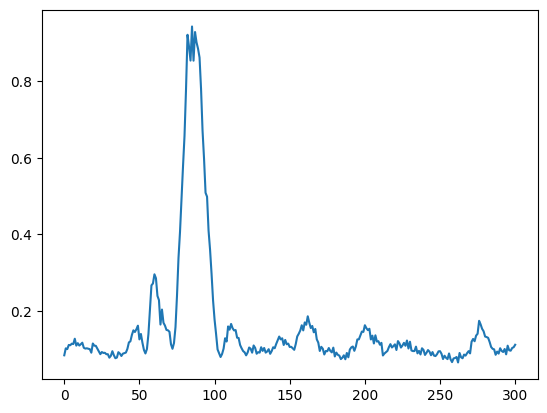

In [20]:
sample_initial = np.mean(normalized_data['initial']['0'], axis = 0)
plt.plot(sample_initial)
plt.show()

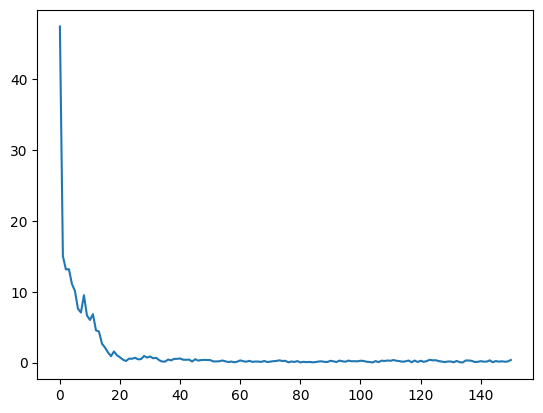

In [21]:
fft_data = np.fft.rfft(sample_initial, axis=0)
magnitude = np.abs(fft_data)
plt.plot(magnitude)
plt.show()

In [22]:
def fft_plot(data):
    # fft_data = gaussian_filter1d(np.fft.rfft(data, axis=0), axis=0, sigma=1)
    fft_data = np.fft.rfft(data, axis=0)
    magnitude = np.abs(fft_data)
    plt.plot(magnitude)
    plt.show()

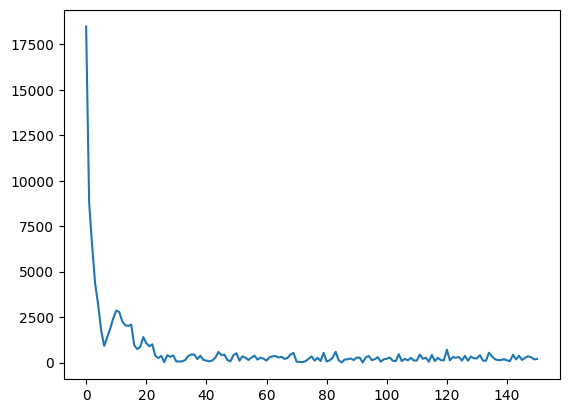

In [23]:
fft_plot(data_dict['04']['2'][4])

In [18]:
def train_test_dict(data):
    train_dict, test_dict = dict(), dict()
    for i in data.keys():
        train_dict[i], test_dict[i] = dict(), dict()
        for j in data[i].keys():
            if j == '0' or j == '4':
                test_dict[i][j] = data[i][j]
            else:
                train_dict[i][j] = data[i][j]
    return train_dict, test_dict

In [68]:
from sklearn.utils import shuffle

def make_dataset_split(train_dict, test_dict):
    # x = list()    
    def make_label(data_dict):
        Y = list()
        X = list()
        for key, data in data_dict.items():
            # print(key)
            if key == 'initial':
                continue
            else:
                x = None
                y = list()
                for key2, data2 in data_dict[key].items():
                    if x is None:
                        x = data2
                    else:
                        x = np.concatenate((x, data2), axis = 0)
                for i in range(x.shape[0]):
                    one_hot = to_categorical(int(key), num_classes=(len(data_dict)-1))
                    y.append(one_hot)
                    
                X.append(x)
                Y.append(y)

        np_X = X[0]
        for i in range(1, len(X)):
            np_X = np.concatenate((np_X, X[i]), axis = 0)
        np_Y = Y[0]
        for i in range(1, len(Y)):
            np_Y = np.concatenate((np_Y, Y[i]), axis = 0)
        
        X, Y = np.array(np_X), np.array(np_Y)
        print('X_shape : ' , X.shape)
        print('Y_shape : ' , Y.shape)

        # X = np.reshape(X, (X.shape[0]*X.shape[1], X.shape[2], X.shape[3]))
        # Y = np.reshape(Y, (Y.shape[0]*Y.shape[1], Y.shape[2]))
        return X, Y
    
    X_train, Y_train = make_label(train_dict)
    X_test, Y_test = make_label(test_dict)
    X_train, Y_train = shuffle(X_train, Y_train, random_state=42)
    X_test, Y_test = shuffle(X_test, Y_test, random_state=42)
    return X_train, X_test, Y_train, Y_test

In [15]:
def make_dataset(data_dict, test_size = 0.2):
    # x = list()
    Y = list()
    X = list()
    for key, data in data_dict.items():
        if key == 'initial':
            continue
        else:
            x = None
            y = list()
            for key2, data2 in data_dict[key].items():
                if x is None:
                    x = data2
                else:
                    x = np.concatenate((x, data2), axis = 0)
            for i in range(x.shape[0]):
                one_hot = to_categorical(int(key), num_classes=(len(data_dict)-1))
                y.append(one_hot)
            X.append(x)
            Y.append(y)
    np_X = X[0]
    for i in range(1, len(X)):
        np_X = np.concatenate((np_X, X[i]), axis = 0)
    np_Y = Y[0]
    for i in range(1, len(Y)):
        np_Y = np.concatenate((np_Y, Y[i]), axis = 0)
        
    X, Y = np.array(np_X), np.array(np_Y)
    # X = np.reshape(X, (X.shape[0]*X.shape[1], X.shape[2], X.shape[3]))
    # Y = np.reshape(Y, (Y.shape[0]*Y.shape[1], Y.shape[2]))
    
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=test_size, random_state=42)
    return X_train, X_test, Y_train, Y_test

In [16]:
train_dict, test_dict = train_test_dict(normalized_data)

NameError: name 'train_test_dict' is not defined

In [69]:
X_train, X_test, Y_train, Y_test = make_dataset_split(train_dict, test_dict)

X_shape :  (2800, 301, 1)
Y_shape :  (2800, 6)
X_shape :  (960, 301, 1)
Y_shape :  (960, 6)


In [17]:
# X_train, X_test, Y_train, Y_test = make_dataset(range_fft_dict)
# X_train, X_test  = 10 * np.log10(X_train), 10 * np.log10(X_test)
# X_train, X_test, Y_train, Y_test = make_dataset(normalized_data)
X_train, X_test, Y_train, Y_test = make_dataset(data_dict)
# X_train, X_test = np.expand_dims(X_train, axis = 2), np.expand_dims(X_test, axis = 2)

2023-10-17 02:29:57.841938: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-10-17 02:29:58.510062: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22288 MB memory:  -> device: 3, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:d8:00.0, compute capability: 8.6


X shape :  (3008, 301, 1)
Model: "resnet"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet_layer (ResnetLayer)  multiple                  24484     
                                                                 
 flatten (Flatten)           multiple                  0         
                                                                 
 dense (Dense)               multiple                  2465920   
                                                                 
 dense_1 (Dense)             multiple                  8256      
                                                                 
 dropout (Dropout)           multiple                  0         
                                                                 
 dense_2 (Dense)             multiple                  2080      
                                                                 
 dense_3 (Dense)             multi

2023-10-17 02:30:02.003984: I tensorflow/stream_executor/cuda/cuda_blas.cc:1614] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2023-10-17 02:30:02.230201: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8401


87/94 [==========================>...] - ETA: 0s - loss: 15.4274 - accuracy: 0.2389 - categorical_crossentropy: 15.4274

INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


94/94 [==============================] - 10s 53ms/step - loss: 14.4067 - accuracy: 0.2440 - categorical_crossentropy: 14.4067 - val_loss: 2.5920 - val_accuracy: 0.2247 - val_categorical_crossentropy: 2.5920
Epoch 2/200
91/94 [============================>.] - ETA: 0s - loss: 1.6865 - accuracy: 0.3307 - categorical_crossentropy: 1.6865

INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


94/94 [==============================] - 4s 46ms/step - loss: 1.6798 - accuracy: 0.3341 - categorical_crossentropy: 1.6798 - val_loss: 1.8905 - val_accuracy: 0.4056 - val_categorical_crossentropy: 1.8905
Epoch 3/200
92/94 [============================>.] - ETA: 0s - loss: 1.4767 - accuracy: 0.4039 - categorical_crossentropy: 1.4767

INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


94/94 [==============================] - 5s 52ms/step - loss: 1.4794 - accuracy: 0.4023 - categorical_crossentropy: 1.4794 - val_loss: 1.4792 - val_accuracy: 0.4295 - val_categorical_crossentropy: 1.4792
Epoch 4/200
93/94 [============================>.] - ETA: 0s - loss: 1.3343 - accuracy: 0.4718 - categorical_crossentropy: 1.3343

INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


94/94 [==============================] - 5s 51ms/step - loss: 1.3309 - accuracy: 0.4731 - categorical_crossentropy: 1.3309 - val_loss: 1.1681 - val_accuracy: 0.5479 - val_categorical_crossentropy: 1.1681
Epoch 5/200
93/94 [============================>.] - ETA: 0s - loss: 1.0851 - accuracy: 0.5729 - categorical_crossentropy: 1.0851

INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


94/94 [==============================] - 4s 48ms/step - loss: 1.0846 - accuracy: 0.5731 - categorical_crossentropy: 1.0846 - val_loss: 0.9462 - val_accuracy: 0.6343 - val_categorical_crossentropy: 0.9462
Epoch 6/200
94/94 [==============================] - 1s 13ms/step - loss: 0.9388 - accuracy: 0.6356 - categorical_crossentropy: 0.9388 - val_loss: 1.0195 - val_accuracy: 0.5997 - val_categorical_crossentropy: 1.0195
Epoch 7/200
93/94 [============================>.] - ETA: 0s - loss: 0.8386 - accuracy: 0.6774 - categorical_crossentropy: 0.8386

INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


94/94 [==============================] - 5s 54ms/step - loss: 0.8374 - accuracy: 0.6775 - categorical_crossentropy: 0.8374 - val_loss: 0.8361 - val_accuracy: 0.6755 - val_categorical_crossentropy: 0.8361
Epoch 8/200
89/94 [===========================>..] - ETA: 0s - loss: 0.6782 - accuracy: 0.7535 - categorical_crossentropy: 0.6782

INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


94/94 [==============================] - 5s 51ms/step - loss: 0.6816 - accuracy: 0.7510 - categorical_crossentropy: 0.6816 - val_loss: 0.6563 - val_accuracy: 0.7606 - val_categorical_crossentropy: 0.6563
Epoch 9/200
94/94 [==============================] - ETA: 0s - loss: 0.5885 - accuracy: 0.7763 - categorical_crossentropy: 0.5885

INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


94/94 [==============================] - 4s 47ms/step - loss: 0.5885 - accuracy: 0.7763 - categorical_crossentropy: 0.5885 - val_loss: 0.5198 - val_accuracy: 0.8005 - val_categorical_crossentropy: 0.5198
Epoch 10/200
87/94 [==========================>...] - ETA: 0s - loss: 0.4390 - accuracy: 0.8420 - categorical_crossentropy: 0.4390

INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


94/94 [==============================] - 5s 52ms/step - loss: 0.4303 - accuracy: 0.8464 - categorical_crossentropy: 0.4303 - val_loss: 0.4471 - val_accuracy: 0.8258 - val_categorical_crossentropy: 0.4471
Epoch 11/200
91/94 [============================>.] - ETA: 0s - loss: 0.3500 - accuracy: 0.8674 - categorical_crossentropy: 0.3500

INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


94/94 [==============================] - 4s 48ms/step - loss: 0.3510 - accuracy: 0.8674 - categorical_crossentropy: 0.3510 - val_loss: 0.4250 - val_accuracy: 0.8418 - val_categorical_crossentropy: 0.4250
Epoch 12/200
94/94 [==============================] - 1s 13ms/step - loss: 0.3724 - accuracy: 0.8640 - categorical_crossentropy: 0.3724 - val_loss: 0.6373 - val_accuracy: 0.7766 - val_categorical_crossentropy: 0.6373
Epoch 13/200
94/94 [==============================] - 1s 11ms/step - loss: 0.2993 - accuracy: 0.8979 - categorical_crossentropy: 0.2993 - val_loss: 0.5297 - val_accuracy: 0.8178 - val_categorical_crossentropy: 0.5297
Epoch 14/200
93/94 [============================>.] - ETA: 0s - loss: 0.2331 - accuracy: 0.9187 - categorical_crossentropy: 0.2331

INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


94/94 [==============================] - 5s 50ms/step - loss: 0.2321 - accuracy: 0.9189 - categorical_crossentropy: 0.2321 - val_loss: 0.4106 - val_accuracy: 0.8657 - val_categorical_crossentropy: 0.4106
Epoch 15/200
94/94 [==============================] - 1s 11ms/step - loss: 0.1773 - accuracy: 0.9365 - categorical_crossentropy: 0.1773 - val_loss: 0.4304 - val_accuracy: 0.8551 - val_categorical_crossentropy: 0.4304
Epoch 16/200
94/94 [==============================] - 1s 13ms/step - loss: 0.1894 - accuracy: 0.9315 - categorical_crossentropy: 0.1894 - val_loss: 0.4912 - val_accuracy: 0.8657 - val_categorical_crossentropy: 0.4912
Epoch 17/200
94/94 [==============================] - ETA: 0s - loss: 0.1399 - accuracy: 0.9511 - categorical_crossentropy: 0.1399

INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


94/94 [==============================] - 5s 51ms/step - loss: 0.1399 - accuracy: 0.9511 - categorical_crossentropy: 0.1399 - val_loss: 0.2897 - val_accuracy: 0.9109 - val_categorical_crossentropy: 0.2897
Epoch 18/200
94/94 [==============================] - 1s 12ms/step - loss: 0.1382 - accuracy: 0.9535 - categorical_crossentropy: 0.1382 - val_loss: 0.3364 - val_accuracy: 0.8910 - val_categorical_crossentropy: 0.3364
Epoch 19/200
90/94 [===========================>..] - ETA: 0s - loss: 0.0937 - accuracy: 0.9674 - categorical_crossentropy: 0.0937

INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


94/94 [==============================] - 4s 47ms/step - loss: 0.1003 - accuracy: 0.9658 - categorical_crossentropy: 0.1003 - val_loss: 0.2807 - val_accuracy: 0.9136 - val_categorical_crossentropy: 0.2807
Epoch 20/200
91/94 [============================>.] - ETA: 0s - loss: 0.0787 - accuracy: 0.9742 - categorical_crossentropy: 0.0787

INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


94/94 [==============================] - 5s 52ms/step - loss: 0.0783 - accuracy: 0.9744 - categorical_crossentropy: 0.0783 - val_loss: 0.2535 - val_accuracy: 0.9215 - val_categorical_crossentropy: 0.2535
Epoch 21/200
94/94 [==============================] - 1s 11ms/step - loss: 0.0662 - accuracy: 0.9764 - categorical_crossentropy: 0.0662 - val_loss: 0.3066 - val_accuracy: 0.9176 - val_categorical_crossentropy: 0.3066
Epoch 22/200
94/94 [==============================] - 1s 13ms/step - loss: 0.0660 - accuracy: 0.9774 - categorical_crossentropy: 0.0660 - val_loss: 0.3248 - val_accuracy: 0.9162 - val_categorical_crossentropy: 0.3248
Epoch 23/200
94/94 [==============================] - 1s 12ms/step - loss: 0.1193 - accuracy: 0.9618 - categorical_crossentropy: 0.1193 - val_loss: 0.3957 - val_accuracy: 0.8936 - val_categorical_crossentropy: 0.3957
Epoch 24/200
94/94 [==============================] - 1s 13ms/step - loss: 0.1430 - accuracy: 0.9501 - categorical_crossentropy: 0.1430 - val_los

INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


94/94 [==============================] - 5s 50ms/step - loss: 0.0500 - accuracy: 0.9827 - categorical_crossentropy: 0.0500 - val_loss: 0.3177 - val_accuracy: 0.9242 - val_categorical_crossentropy: 0.3177
Epoch 42/200
94/94 [==============================] - 1s 13ms/step - loss: 0.0541 - accuracy: 0.9811 - categorical_crossentropy: 0.0541 - val_loss: 1.0110 - val_accuracy: 0.8457 - val_categorical_crossentropy: 1.0110
Epoch 43/200
94/94 [==============================] - 1s 12ms/step - loss: 0.2141 - accuracy: 0.9475 - categorical_crossentropy: 0.2141 - val_loss: 0.5696 - val_accuracy: 0.8910 - val_categorical_crossentropy: 0.5696
Epoch 44/200
94/94 [==============================] - 1s 12ms/step - loss: 0.0933 - accuracy: 0.9744 - categorical_crossentropy: 0.0933 - val_loss: 0.4507 - val_accuracy: 0.9069 - val_categorical_crossentropy: 0.4507
Epoch 45/200
94/94 [==============================] - 1s 14ms/step - loss: 0.1962 - accuracy: 0.9538 - categorical_crossentropy: 0.1962 - val_los

INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


94/94 [==============================] - 5s 50ms/step - loss: 0.0520 - accuracy: 0.9864 - categorical_crossentropy: 0.0520 - val_loss: 0.3688 - val_accuracy: 0.9335 - val_categorical_crossentropy: 0.3688
Epoch 48/200
90/94 [===========================>..] - ETA: 0s - loss: 0.0280 - accuracy: 0.9906 - categorical_crossentropy: 0.0280

INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


94/94 [==============================] - 5s 52ms/step - loss: 0.0275 - accuracy: 0.9907 - categorical_crossentropy: 0.0275 - val_loss: 0.2796 - val_accuracy: 0.9402 - val_categorical_crossentropy: 0.2796
Epoch 49/200
94/94 [==============================] - 1s 11ms/step - loss: 0.0242 - accuracy: 0.9910 - categorical_crossentropy: 0.0242 - val_loss: 0.2891 - val_accuracy: 0.9375 - val_categorical_crossentropy: 0.2891
Epoch 50/200
94/94 [==============================] - ETA: 0s - loss: 0.0252 - accuracy: 0.9917 - categorical_crossentropy: 0.0252

INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


94/94 [==============================] - 5s 54ms/step - loss: 0.0252 - accuracy: 0.9917 - categorical_crossentropy: 0.0252 - val_loss: 0.3374 - val_accuracy: 0.9441 - val_categorical_crossentropy: 0.3374
Epoch 51/200
94/94 [==============================] - 1s 12ms/step - loss: 0.0191 - accuracy: 0.9943 - categorical_crossentropy: 0.0191 - val_loss: 0.3429 - val_accuracy: 0.9375 - val_categorical_crossentropy: 0.3429
Epoch 52/200
89/94 [===========================>..] - ETA: 0s - loss: 0.0095 - accuracy: 0.9968 - categorical_crossentropy: 0.0095

INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


94/94 [==============================] - 4s 47ms/step - loss: 0.0101 - accuracy: 0.9963 - categorical_crossentropy: 0.0101 - val_loss: 0.3252 - val_accuracy: 0.9468 - val_categorical_crossentropy: 0.3252
Epoch 53/200
94/94 [==============================] - 1s 11ms/step - loss: 0.0915 - accuracy: 0.9807 - categorical_crossentropy: 0.0915 - val_loss: 0.3909 - val_accuracy: 0.9322 - val_categorical_crossentropy: 0.3909
Epoch 54/200
94/94 [==============================] - 1s 11ms/step - loss: 0.1296 - accuracy: 0.9701 - categorical_crossentropy: 0.1296 - val_loss: 0.2660 - val_accuracy: 0.9322 - val_categorical_crossentropy: 0.2660
Epoch 55/200
94/94 [==============================] - 1s 11ms/step - loss: 0.0955 - accuracy: 0.9764 - categorical_crossentropy: 0.0955 - val_loss: 0.3953 - val_accuracy: 0.9255 - val_categorical_crossentropy: 0.3953
Epoch 56/200
94/94 [==============================] - 1s 11ms/step - loss: 0.0464 - accuracy: 0.9844 - categorical_crossentropy: 0.0464 - val_los

INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


94/94 [==============================] - 5s 58ms/step - loss: 0.0253 - accuracy: 0.9930 - categorical_crossentropy: 0.0253 - val_loss: 0.1590 - val_accuracy: 0.9641 - val_categorical_crossentropy: 0.1590
Epoch 65/200
94/94 [==============================] - 1s 14ms/step - loss: 0.0065 - accuracy: 0.9983 - categorical_crossentropy: 0.0065 - val_loss: 0.2048 - val_accuracy: 0.9521 - val_categorical_crossentropy: 0.2048
Epoch 66/200
94/94 [==============================] - 1s 13ms/step - loss: 0.0391 - accuracy: 0.9890 - categorical_crossentropy: 0.0391 - val_loss: 0.5082 - val_accuracy: 0.9215 - val_categorical_crossentropy: 0.5082
Epoch 67/200
94/94 [==============================] - 2s 16ms/step - loss: 0.3116 - accuracy: 0.9501 - categorical_crossentropy: 0.3116 - val_loss: 0.8787 - val_accuracy: 0.8737 - val_categorical_crossentropy: 0.8787
Epoch 68/200
94/94 [==============================] - 1s 13ms/step - loss: 0.3399 - accuracy: 0.9422 - categorical_crossentropy: 0.3399 - val_los

INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


94/94 [==============================] - 5s 53ms/step - loss: 0.0075 - accuracy: 0.9987 - categorical_crossentropy: 0.0075 - val_loss: 0.2375 - val_accuracy: 0.9654 - val_categorical_crossentropy: 0.2375
Epoch 88/200
94/94 [==============================] - 1s 14ms/step - loss: 0.0558 - accuracy: 0.9907 - categorical_crossentropy: 0.0558 - val_loss: 0.4950 - val_accuracy: 0.9388 - val_categorical_crossentropy: 0.4950
Epoch 89/200
94/94 [==============================] - 1s 13ms/step - loss: 0.0221 - accuracy: 0.9953 - categorical_crossentropy: 0.0221 - val_loss: 0.3011 - val_accuracy: 0.9468 - val_categorical_crossentropy: 0.3011
Epoch 90/200
94/94 [==============================] - 1s 13ms/step - loss: 0.0144 - accuracy: 0.9963 - categorical_crossentropy: 0.0144 - val_loss: 0.2300 - val_accuracy: 0.9561 - val_categorical_crossentropy: 0.2300
Epoch 91/200
94/94 [==============================] - 1s 11ms/step - loss: 0.0106 - accuracy: 0.9967 - categorical_crossentropy: 0.0106 - val_los

INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


94/94 [==============================] - 5s 51ms/step - loss: 0.0082 - accuracy: 0.9977 - categorical_crossentropy: 0.0082 - val_loss: 0.1809 - val_accuracy: 0.9707 - val_categorical_crossentropy: 0.1809
Epoch 115/200
94/94 [==============================] - 1s 11ms/step - loss: 0.0052 - accuracy: 0.9983 - categorical_crossentropy: 0.0052 - val_loss: 0.1790 - val_accuracy: 0.9694 - val_categorical_crossentropy: 0.1790
Epoch 116/200
94/94 [==============================] - 1s 11ms/step - loss: 0.0013 - accuracy: 0.9997 - categorical_crossentropy: 0.0013 - val_loss: 0.2294 - val_accuracy: 0.9668 - val_categorical_crossentropy: 0.2294
Epoch 117/200
94/94 [==============================] - 1s 14ms/step - loss: 9.4121e-04 - accuracy: 0.9997 - categorical_crossentropy: 9.4121e-04 - val_loss: 0.2210 - val_accuracy: 0.9654 - val_categorical_crossentropy: 0.2210
Epoch 118/200
94/94 [==============================] - 2s 17ms/step - loss: 0.0037 - accuracy: 0.9993 - categorical_crossentropy: 0.00

INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


94/94 [==============================] - 4s 46ms/step - loss: 0.0306 - accuracy: 0.9927 - categorical_crossentropy: 0.0306 - val_loss: 0.2589 - val_accuracy: 0.9721 - val_categorical_crossentropy: 0.2589
Epoch 137/200
94/94 [==============================] - 1s 14ms/step - loss: 0.0469 - accuracy: 0.9900 - categorical_crossentropy: 0.0469 - val_loss: 0.4038 - val_accuracy: 0.9521 - val_categorical_crossentropy: 0.4038
Epoch 138/200
93/94 [============================>.] - ETA: 0s - loss: 0.0117 - accuracy: 0.9970 - categorical_crossentropy: 0.0117

INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


INFO:tensorflow:Assets written to: ./model/resnet_disk/assets


94/94 [==============================] - 5s 56ms/step - loss: 0.0116 - accuracy: 0.9970 - categorical_crossentropy: 0.0116 - val_loss: 0.0931 - val_accuracy: 0.9801 - val_categorical_crossentropy: 0.0931
Epoch 139/200
94/94 [==============================] - 1s 11ms/step - loss: 0.0391 - accuracy: 0.9943 - categorical_crossentropy: 0.0391 - val_loss: 0.3336 - val_accuracy: 0.9574 - val_categorical_crossentropy: 0.3336
Epoch 140/200
94/94 [==============================] - 1s 10ms/step - loss: 0.0265 - accuracy: 0.9930 - categorical_crossentropy: 0.0265 - val_loss: 0.2793 - val_accuracy: 0.9574 - val_categorical_crossentropy: 0.2793
Epoch 141/200
94/94 [==============================] - 1s 16ms/step - loss: 0.0115 - accuracy: 0.9980 - categorical_crossentropy: 0.0115 - val_loss: 0.2901 - val_accuracy: 0.9668 - val_categorical_crossentropy: 0.2901
Epoch 142/200
94/94 [==============================] - 1s 12ms/step - loss: 0.0058 - accuracy: 0.9980 - categorical_crossentropy: 0.0058 - val

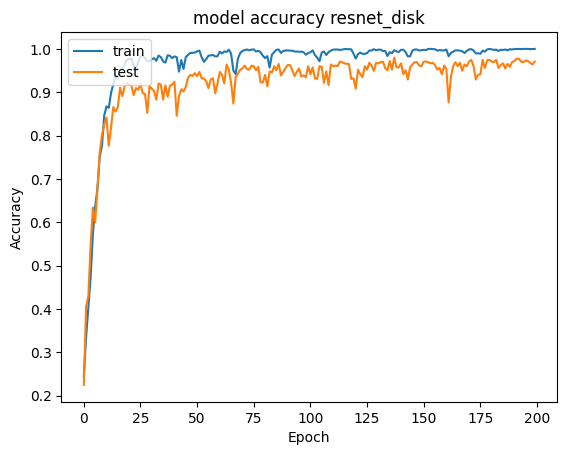

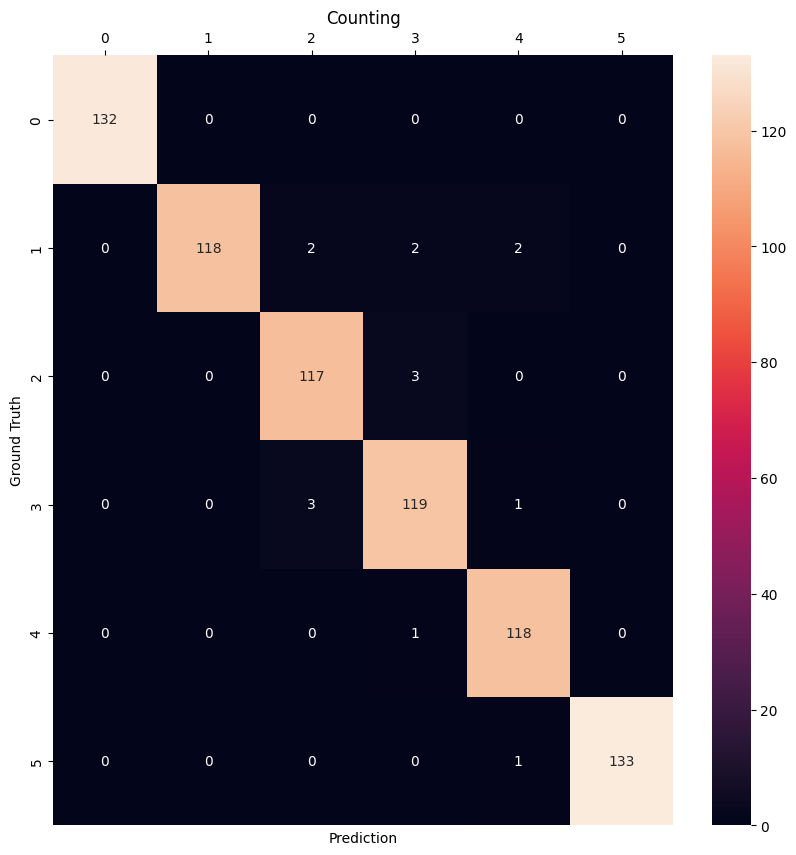

In [18]:
# non_norm_model = non_norm(len(range_fft_dict))

# base model
# model = basemodel(len(range_fft_dict))

# Resnet
filter_in_list = [1, 32]
filter_out_list = [32, 64]
kernel_size = 3
# model = build_resnet(filter_in_list = filter_in_list, filter_out_list = filter_out_list, kernel_size = kernel_size, out_nums=len(reshaped_data))
model = Resnet(filter_in = filter_in_list, filters = filter_out_list, kernel_size = kernel_size, out_nums=Y_train.shape[1])
# model = Resnet(filter_in = filter_in_list, filters = filter_out_list, kernel_size = kernel_size, out_nums=Y_train.shape[1])
history = train(model = model, X = X_train, Y = Y_train, test_X = X_test, test_Y = Y_test, cp_path = 'resnet_disk', Epoch=200)

X shape :  (2800, 301, 1)
Model: "resnet_pool"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet_layer_2 (ResnetLayer  multiple                 24484     
 )                                                               
                                                                 
 max_pooling1d (MaxPooling1D  multiple                 0         
 )                                                               
                                                                 
 flatten_2 (Flatten)         multiple                  0         
                                                                 
 dense_8 (Dense)             multiple                  1228928   
                                                                 
 dense_9 (Dense)             multiple                  8256      
                                                                 
 dense_10 (Dense)            

INFO:tensorflow:Assets written to: ./model/resnet_pool_disk_split/assets


INFO:tensorflow:Assets written to: ./model/resnet_pool_disk_split/assets


88/88 [==============================] - 6s 56ms/step - loss: 3.3399 - accuracy: 0.3461 - categorical_crossentropy: 3.3399 - val_loss: 1.8373 - val_accuracy: 0.2031 - val_categorical_crossentropy: 1.8373
Epoch 2/200
88/88 [==============================] - 2s 18ms/step - loss: 0.9067 - accuracy: 0.6486 - categorical_crossentropy: 0.9067 - val_loss: 1.9699 - val_accuracy: 0.1667 - val_categorical_crossentropy: 1.9699
Epoch 3/200
88/88 [==============================] - 2s 19ms/step - loss: 0.3980 - accuracy: 0.8557 - categorical_crossentropy: 0.3980 - val_loss: 2.1143 - val_accuracy: 0.1729 - val_categorical_crossentropy: 2.1143
Epoch 4/200
88/88 [==============================] - 2s 19ms/step - loss: 0.1664 - accuracy: 0.9525 - categorical_crossentropy: 0.1664 - val_loss: 3.1222 - val_accuracy: 0.1469 - val_categorical_crossentropy: 3.1222
Epoch 5/200
88/88 [==============================] - 2s 19ms/step - loss: 0.0643 - accuracy: 0.9836 - categorical_crossentropy: 0.0643 - val_loss: 4

INFO:tensorflow:Assets written to: ./model/resnet_pool_disk_split/assets


INFO:tensorflow:Assets written to: ./model/resnet_pool_disk_split/assets


88/88 [==============================] - 4s 49ms/step - loss: 0.0151 - accuracy: 0.9979 - categorical_crossentropy: 0.0151 - val_loss: 22.3595 - val_accuracy: 0.2073 - val_categorical_crossentropy: 22.3595
Epoch 102/200
88/88 [==============================] - 2s 19ms/step - loss: 1.2190 - accuracy: 0.7525 - categorical_crossentropy: 1.2190 - val_loss: 7.0573 - val_accuracy: 0.1219 - val_categorical_crossentropy: 7.0573
Epoch 103/200
88/88 [==============================] - 2s 18ms/step - loss: 0.0551 - accuracy: 0.9850 - categorical_crossentropy: 0.0551 - val_loss: 7.8954 - val_accuracy: 0.1198 - val_categorical_crossentropy: 7.8954
Epoch 104/200
88/88 [==============================] - 2s 19ms/step - loss: 0.0137 - accuracy: 0.9975 - categorical_crossentropy: 0.0137 - val_loss: 8.5476 - val_accuracy: 0.1281 - val_categorical_crossentropy: 8.5476
Epoch 105/200
88/88 [==============================] - 2s 19ms/step - loss: 0.0046 - accuracy: 0.9993 - categorical_crossentropy: 0.0046 - v

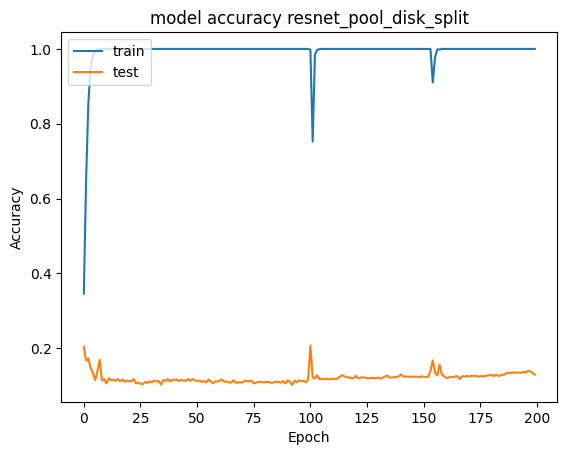

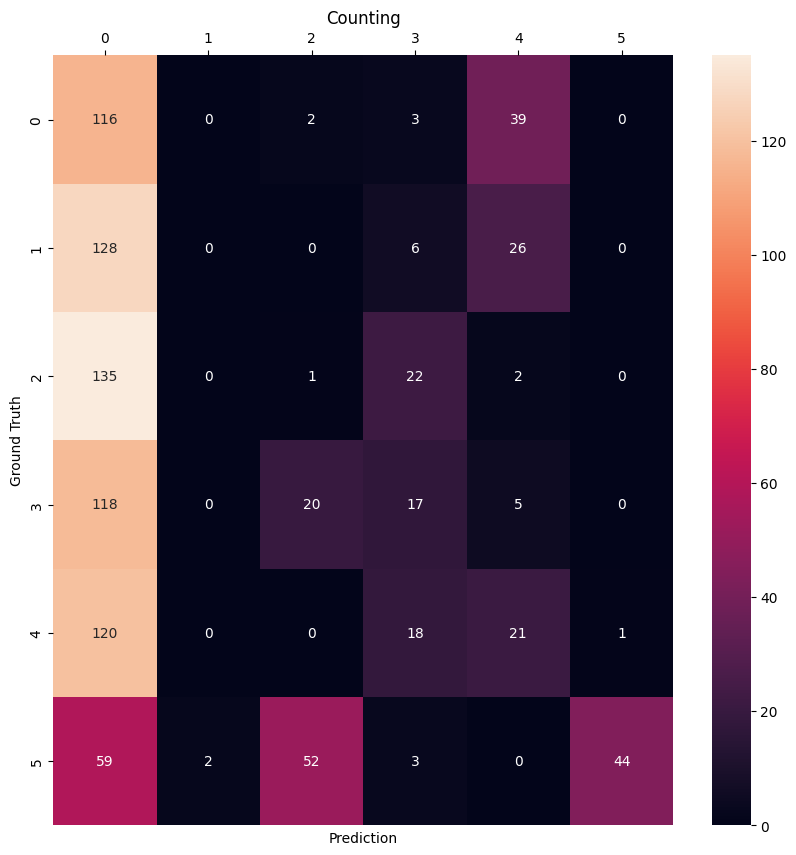

In [72]:
filter_in_list = [1, 32]
filter_out_list = [32, 64]
kernel_size = 3
# model = build_resnet(filter_in_list = filter_in_list, filter_out_list = filter_out_list, kernel_size = kernel_size, out_nums=len(reshaped_data))
model = Resnet_pool(filter_in = filter_in_list, filters = filter_out_list, kernel_size = kernel_size, out_nums=Y_train.shape[1])
# model = Resnet(filter_in = filter_in_list, filters = filter_out_list, kernel_size = kernel_size, out_nums=Y_train.shape[1])
history = train(model = model, X = X_train, Y = Y_train, test_X = X_test, test_Y = Y_test, cp_path = 'resnet_pool_disk_split', Epoch=200)